In [23]:
import numpy as np
print(np.version.version)
from numpy import loadtxt
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import glob
from numpy import diff
import pandas as pn
import math
import scipy.constants as sc
import pickle
import copy
from scipy import interpolate
from matplotlib import rcParams, cycler, cm, rc
plotall = True
overview_plot = True
from pylab import meshgrid,cm,imshow,contour,clabel,colorbar,axis,title,show,pcolor
import pandas as pd
import os
import matplotlib.ticker as ticker
from matplotlib.ticker import ScalarFormatter
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
from numpy.polynomial import Polynomial
import matplotlib.cm as cm
import matplotlib as mpl
import numpy.ma as ma

1.24.3


In [3]:
%run NNO_Functions_FM301.ipynb

In [4]:
"---Folder Paths---"


folder_Hall_Bar_6_IVs = r"C:\Users\pblah\Data\Navy Beach\FM301\Hall Bar 6\IVs"
pathlist_Hall_Bar_6_IVs = folderpath(folder_Hall_Bar_6_IVs)

folder_Hall_Bar_6_IVs_warmup_longsweep = r"C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Warmup\Raw Data\Data"
pathlist_Hall_Bar_6_IVs_warmup_longsweep = folderpath(folder_Hall_Bar_6_IVs_warmup_longsweep)

folder_Hall_Bar_6_IVs_warmup_longsweep_offsetted = r"C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Warmup\Offsetted"
pathlist_Hall_Bar_6_IVs_warmup_longsweep_offsetted = folderpath_csv(folder_Hall_Bar_6_IVs_warmup_longsweep_offsetted)

folder_Hall_Bar_6_IVs_ramp_cooldown = r"C:\Users\pblah\Data\Navy Beach\FM301\Hall Bar 6\IVs\With Ramp\Cooldown"
pathlist_Hall_Bar_6_IVs_ramp_cooldown = folderpath(folder_Hall_Bar_6_IVs_ramp_cooldown)

folder_Hall_Bar_6_IVs_ramp_warmup = r"C:\Users\pblah\Data\Navy Beach\FM301\Hall Bar 6\IVs\With Ramp\Warmup"
pathlist_Hall_Bar_6_IVs_ramp_warmup = folderpath(folder_Hall_Bar_6_IVs_ramp_warmup)

folder_Hall_Bar_6_IVs_moredatapoints_warmup = r"C:\Users\pblah\Data\Navy Beach\FM301\Hall Bar 6\IVs\With More Datapoints\Warmup"
pathlist_Hall_Bar_6_IVs_moredatapoints_warmup = folderpath(folder_Hall_Bar_6_IVs_moredatapoints_warmup)

folder_Hall_Bar_6_IVs_moredatapoints_cooldown = r"C:\Users\pblah\Data\Navy Beach\FM301\Hall Bar 6\IVs\With More Datapoints\Cooldown"
pathlist_Hall_Bar_6_IVs_moredatapoints_cooldown = folderpath(folder_Hall_Bar_6_IVs_moredatapoints_cooldown)

folder_Hall_Bar_6_IV_testing  = r"C:\Users\pblah\Data\Navy Beach\FM301\Hall Bar 6\IVs\Testing"
pathlist_Hall_Bar_6_IV_testing = folderpath(folder_Hall_Bar_6_IV_testing)

folder_Hall_Bar_6_IVs_longsweep = r"C:\Users\pblah\Data\Navy Beach\FM301\Hall Bar 6\IVs\Long Sweep Cooldown"
pathlist_Hall_Bar_6_IVs_longsweep = folderpath(folder_Hall_Bar_6_IVs_longsweep)

folder_Hall_Bar_6_IVs_longsweep_normalised_data = r"C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Initial Normalisation"
pathlist_Hall_Bar_6_IVs_longsweep_normalised_data = folderpath_csv(folder_Hall_Bar_6_IVs_longsweep_normalised_data)
    
    
folder_Hall_Bar_6_IVs_longsweep_symmetrised_data = r"C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Symmetrised"
pathlist_Hall_Bar_6_IVs_longsweep_symmetrised_data = folderpath_csv(folder_Hall_Bar_6_IVs_longsweep_symmetrised_data)

folder_Hall_Bar_6_IVs_longsweep_cut_and_fitted =  r"C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Cut and Fitted"
pathlist_Hall_Bar_6_IVs_longsweep_cut_and_fitted = folderpath_csv(folder_Hall_Bar_6_IVs_longsweep_cut_and_fitted)

folder_Hall_Bar_6_IVs_longsweep_warmup_cut_and_fitted =  r"C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Warmup\Cut and Fitted"
pathlist_Hall_Bar_6_IVs_longsweep_warmup_cut_and_fitted = folderpath_csv(folder_Hall_Bar_6_IVs_longsweep_warmup_cut_and_fitted)

folder_Hall_Bar_6_IVs_longsweep_warmup_symmetrised_data = r"C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Warmup\Symmetrised"
pathlist_Hall_Bar_6_IVs_longsweep_warmup_symmetrised_data = folderpath_csv(folder_Hall_Bar_6_IVs_longsweep_warmup_symmetrised_data)

folder_Hall_Bar_6_IVs_RT_cooldown = r"C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\R vs T"
pathlist_Hall_Bar_6_IVs_RT_cooldown = folderpath_csv(folder_Hall_Bar_6_IVs_RT_cooldown)

folder_Hall_Bar_6_IVs_RT_warmup = r"C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Warmup\R vs T"
pathlist_Hall_Bar_6_IVs_RT_warmup = folderpath_csv(folder_Hall_Bar_6_IVs_RT_warmup)

folder_Hall_Bar_6_IVs_combining_pandas = r"C:\Users\pblah\Data\Navy Beach\FM301\Data\Resitivity Combined Pandas"
pathlist_Hall_Bar_6_IVs_combining_pandas = folderpath_csv(folder_Hall_Bar_6_IVs_combining_pandas)







#print(pathlist_Hall_Bar_6_IVs)
#print(len(pathlist_Hall_Bar_6_IVs_warmup_longsweep))
#print(pathlist_Hall_Bar_6_IVs_ramp_cooldown)
#print(pathlist_Hall_Bar_6_IVs_ramp_warmup)
#print(pathlist_Hall_Bar_6_IVs_moredatapoints_warmup)
#print(folder_Hall_Bar_6_IVs_moredatapoints_warmup)
#print(len(pathlist_Hall_Bar_6_IVs_moredatapoints_warmup))
#print(len(pathlist_Hall_Bar_6_IVs_longsweep))
#print(pathlist_Hall_Bar_6_IVs_longsweep_normalised_data)
#print(len(pathlist_Hall_Bar_6_IVs_longsweep_data))
#print(len(pathlist_Hall_Bar_6_IVs_longsweep_symmetrised_data))
#print(pathlist_Hall_Bar_6_IVs_longsweep_symmetrised_data)
#print(pathlist_Hall_Bar_6_IVs_longsweep_cut_and_fitted)
#print(len(pathlist_Hall_Bar_6_IVs_warmup_longsweep_offsetted))
#print(pathlist_Hall_Bar_6_IVs_longsweep_warmup_cut_and_fitted)
#print(pathlist_Hall_Bar_6_IVs_longsweep_warmup_symmetrised_data)
#print(pathlist_Hall_Bar_6_IVs_RT_cooldown)
#print(pathlist_Hall_Bar_6_IVs_RT_warmup)
print(pathlist_Hall_Bar_6_IVs_combining_pandas)



['C:\\Users\\pblah\\Data\\Navy Beach\\FM301\\Data\\Resitivity Combined Pandas\\FM301 Hall Bar 6 Resitivity vs T cooldown.csv', 'C:\\Users\\pblah\\Data\\Navy Beach\\FM301\\Data\\Resitivity Combined Pandas\\FM301 Hall Bar 6 Resitivity vs T warmup.csv']


# Temperature Lists #

In [5]:
def findtemperature(array):
    F = int(len(array))
    Temperature_list = []
    for i,path in enumerate(array):
        file = path[F::]
        T_index_max = file.find('K.')
        string_tmp = file[T_index_max-6:T_index_max]
        T_index_min = string_tmp.find('_')
        Temperature = string_tmp[T_index_min+1::]
        Temperature=float(Temperature)
        Temperature_list = np.append(Temperature_list,Temperature)
        Temperature_list = np.round(Temperature_list)
    return Temperature_list    


## Closest Element Function ##

In [6]:
def closest_element(array,value):
    element = min(array, key=lambda x:abs(x-value))
    closest_element = np.where(array == element)[0][0]
    return closest_element

## Closest Element Range Function##

In [7]:
def closest_element_index(array,value):
    array1 = np.sort(array)
    closest_element = min(array1, key=lambda x:abs(x-value))
    closest_element_index = np.where(array1 == closest_element)[0][0]
    closest_index_range = array1[closest_element_index-1 : closest_element_index+1]
    mylist = []
    for i in closest_index_range:
        closest_index_actual = np.where(array == i)[0]
        mylist = np.sort(np.append(mylist,closest_index_actual))
    return mylist

# IVs #

## Long Sweep  ##

# Cooldown #

### Checking the IVs ###

### Plotting raw IVs ###

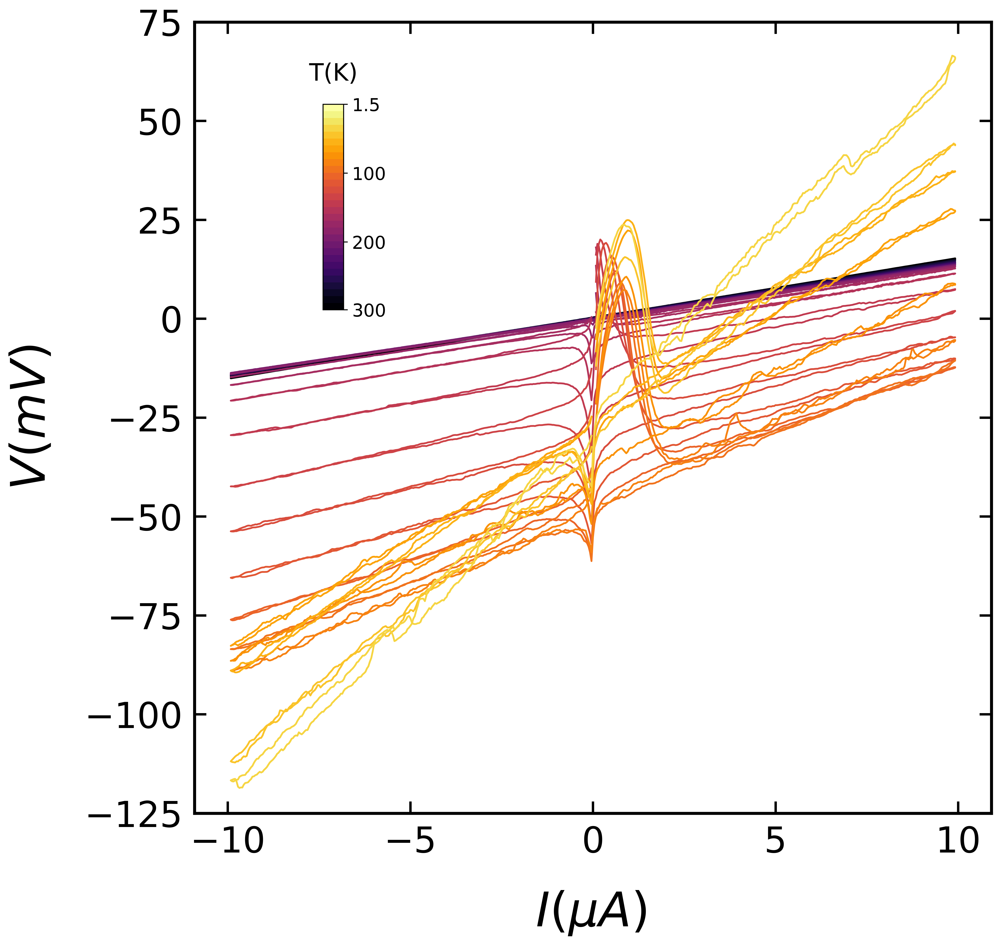

In [8]:
fig, ax = plt.subplots(figsize=(12, 12), dpi = 500)
temperature_list = findtemperature(pathlist_Hall_Bar_6_IVs_longsweep)
cm = plt.get_cmap('inferno', 30)

  
for i,data in enumerate(pathlist_Hall_Bar_6_IVs_longsweep):
    
    dataextracted = dataextractorIVs(data)
    current = dataextracted[0]
    V_Keithley = dataextracted[1]
    RLKin = dataextracted[1]
    ax.set_ylim(-125,75)
    ax.plot(current*1E6,V_Keithley*1E3 ,label = temperature_list[i], color=cm(i/len(temperature_list)-0.1))







norm = mpl.colors.Normalize(vmin=1.5, vmax=300)
sm = plt.cm.ScalarMappable(cmap=cm,norm = norm)
cax = fig.add_axes([0.25, 0.6, 0.02, 0.20])
tick_list = np.arange(temperature_list.min(),temperature_list.max(),80)
tick_list1 = [300,200,100,1.5]
cbar = plt.colorbar(sm, cax=cax, shrink = 0.01, orientation='vertical')
cbar.set_ticks(tick_list1[::-1])
cbar.set_ticklabels(list(map(str, tick_list1)))
cbar.ax.tick_params(labelsize=15)
cbar.ax.set_title('T(K)', fontsize = 20, pad = 20)


ax.set_xlabel("$I (\mu A)$ ",fontsize=40,labelpad = 25)
ax.set_ylabel(r'$V(mV)$',fontsize=40,labelpad = 25)

ax.tick_params(axis = 'x', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, top = True)
ax.tick_params(axis = 'y', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)
ax.tick_params(axis = 'y', which='minor', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)


ax.spines["top"].set_linewidth(2.5)
ax.spines["bottom"].set_linewidth(2.5)
ax.spines["right"].set_linewidth(2.5)
ax.spines["left"].set_linewidth(2.5)







plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_IVs_Longsweep_Raw.pdf",bbox_inches = "tight", format = "pdf")
plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_IVs_Longsweep_Raw.png",bbox_inches = "tight")
plt.show()


#plt.legend(labels = temperature_list)
#plt.xlim(0.75E-5,1E-5)
#plt.ylim(0.01,0.017)
#ax.xaxis.offsetText.set_fontsize(24)


## Offsetting ##

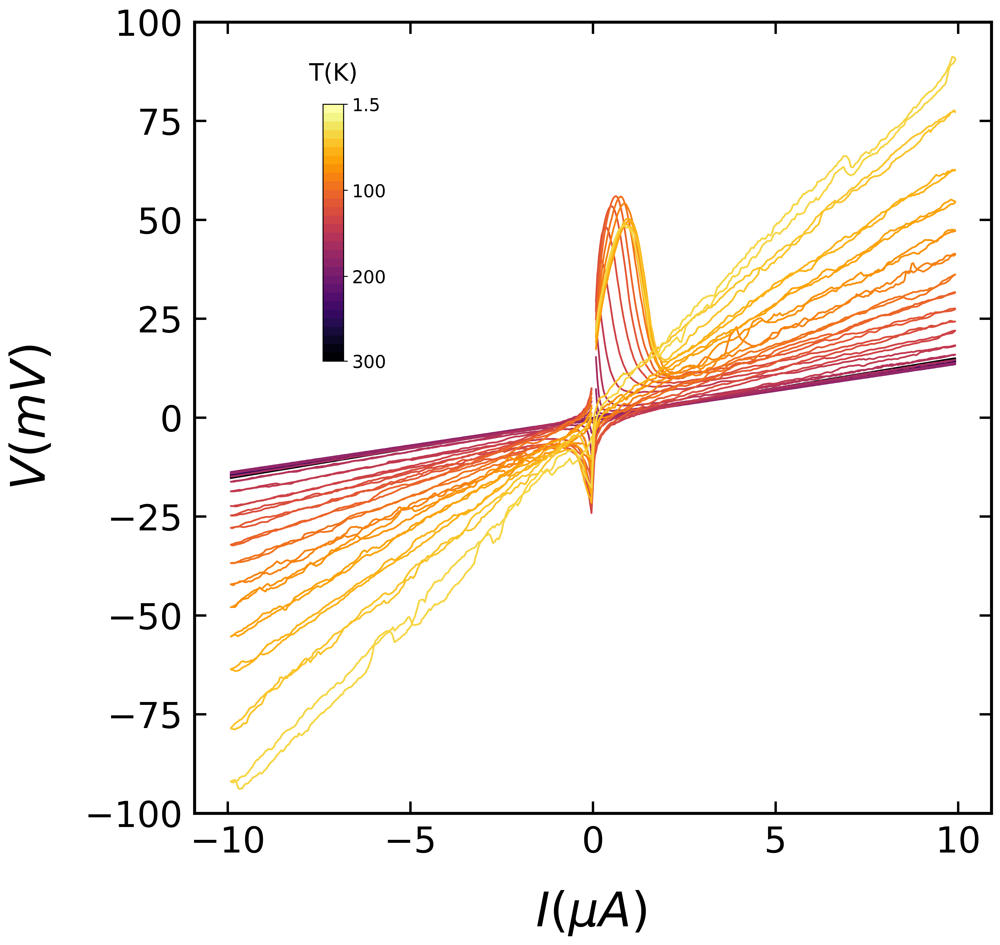

In [9]:
fig, ax = plt.subplots(figsize=(12, 12), dpi = 500)
cm = plt.get_cmap('inferno', 30)

temperature_list = findtemperature(pathlist_Hall_Bar_6_IVs_longsweep)

  
for i,path in enumerate(pathlist_Hall_Bar_6_IVs_longsweep):

    dataextracted = dataextractorIVs(path)
    current = dataextracted[0]
    V_Keithley = dataextracted[1]
    RLKin = dataextracted[1]
    
    plus10uA = int(closest_element_index(current,10E-6)[0])
    minus10uA = int(closest_element_index(current,-9.89E-6)[0])


    V_Keithley_endpoints = [V_Keithley[plus10uA],V_Keithley[minus10uA]]
    current_endpoints = [current[plus10uA],current[minus10uA]]
    line_y = interpolate.interp1d(current_endpoints, V_Keithley_endpoints)
    V_Keithley_int_line = line_y(current)
    offset = V_Keithley_int_line[0]
    V_Keithley_norm = V_Keithley - offset
    
    ax.set_ylim(-100,100)
    ax.plot(current*1E6,V_Keithley_norm*1E3,label = temperature_list[i],color=cm(i/len(temperature_list)-0.1))
    
    df = pd.DataFrame({'current':current,'V_Keithley':V_Keithley_norm})
    df.to_csv(r'C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Initial Normalisation\ ' + str(i) + " " + 'FM301 Hall Bar 6 Normalised IVs' + " " + str(temperature_list[i]) + "K" + '.csv')
    


norm = mpl.colors.Normalize(vmin=1.5, vmax=300)
sm = plt.cm.ScalarMappable(cmap=cm,norm = norm)
cax = fig.add_axes([0.25, 0.55, 0.02, 0.25])
tick_list = np.arange(temperature_list.min(),temperature_list.max(),80)
tick_list1 = [300,200,100,1.5]
cbar = plt.colorbar(sm, cax=cax, shrink = 0.01, orientation='vertical')
cbar.set_ticks(tick_list1[::-1])
cbar.set_ticklabels(list(map(str, tick_list1)))
cbar.ax.tick_params(labelsize=15)
cbar.ax.set_title('T(K)', fontsize = 20, pad = 20)


ax.set_xlabel("$I (\mu A)$ ",fontsize=40,labelpad = 25)
ax.set_ylabel(r'$V(mV)$',fontsize=40,labelpad = 25)

ax.tick_params(axis = 'x', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, top = True)
ax.tick_params(axis = 'y', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)
ax.tick_params(axis = 'y', which='minor', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)


ax.spines["top"].set_linewidth(2.5)
ax.spines["bottom"].set_linewidth(2.5)
ax.spines["right"].set_linewidth(2.5)
ax.spines["left"].set_linewidth(2.5)















plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_IVs_Longsweep_Offset_Fixed.pdf",bbox_inches = "tight", format = "pdf")
plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_IVs_Longsweep_Offset_Fixed.png",bbox_inches = "tight")
plt.show()
    
#print("i",i)
#print("data",data)    
#plt.scatter(current[plus10uA],V_Keithley[plus10uA])
#plt.scatter(current[minus10uA],V_Keithley[minus10uA])
#print('V_Keithley plus10uA',V_Keithley[plus10uA])
#print('V_Keithley minus10uA',V_Keithley[minus10uA])
#plt.plot(current,V_Keithley_int_line)
#plt.scatter(current,V_Keithley,s=1, color = 'red')
#plt.plot(current,V_Keithley_int_line,color = 'blue')

#ax.xaxis.offsetText.set_fontsize(24)

#plt.legend(labels = temperature_list)

#plt.xlim(0.75E-5,1E-5)
#plt.ylim(0.01,0.017)


## Cut and Fitting (With help from Graham) ##

C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Initial Normalisation\ 0 FM301 Hall Bar 6 Normalised IVs 298.0K.csv
1.525450748425785
C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Initial Normalisation\ 1 FM301 Hall Bar 6 Normalised IVs 291.0K.csv
1.5158901000985023
C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Initial Normalisation\ 2 FM301 Hall Bar 6 Normalised IVs 281.0K.csv
1.5076238733941791
C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Initial Normalisation\ 3 FM301 Hall Bar 6 Normalised IVs 271.0K.csv
1.4953951311429747
C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Initial Normalisation\ 4 FM301 Hall Bar 6 Normalised IVs 261.0K.csv
1.4854649245845915
C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Initial Normalisation\ 5 FM301 Hall Bar 6 Normalised IVs 251.0K.csv
1.474892027122107
C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Initial Normalisation\ 6 FM301 Hall Bar 6 Normalised IVs 241.0K.csv
1.4623927196704267
C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Initial Normalisation\ 7 

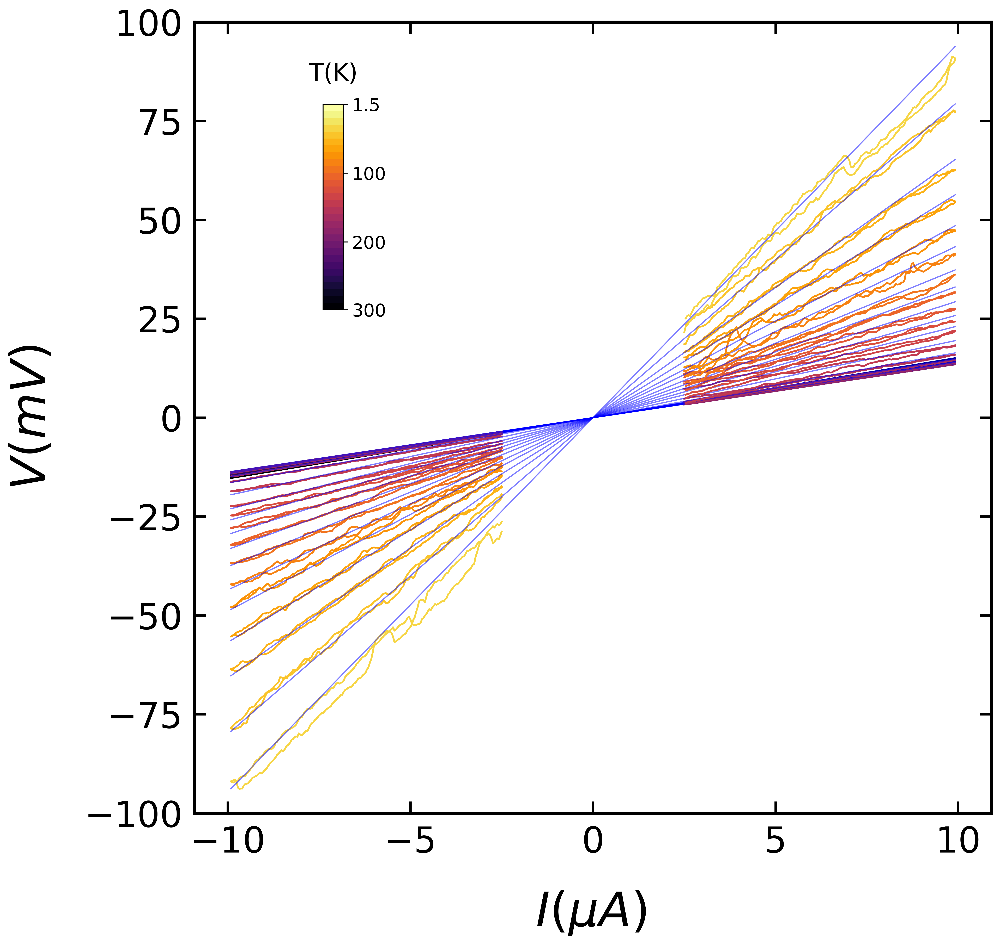

In [10]:
folder = folder_Hall_Bar_6_IVs_longsweep_normalised_data
temperature_list = findtemperature(pathlist_Hall_Bar_6_IVs_longsweep)

fig, ax = plt.subplots(figsize=(12, 12), dpi = 500)
cm = plt.get_cmap('inferno', 30)



for i,path in enumerate(pathlist_Hall_Bar_6_IVs_longsweep_normalised_data):
    
    print(path)

    data = np.loadtxt(path,delimiter = ",",skiprows = 1,usecols = (1,2),unpack = True)
    current = data[0]*1E6
    V_Keithley = data[1]*1E3

    threshold = 2.5
    current_masked = ma.masked_array(current, mask = np.logical_and(current<threshold,current>-threshold) )
    
    ax.set_ylim(-100,100)
    ax.plot(current_masked,V_Keithley,color=cm(i/len(temperature_list)-0.1))
    R=np.polyfit(current,V_Keithley, 1)[0]
    print(R)
    #R[i]=np.polyfit(current,V_Keithley, 1)[0]
    #print(R[i])
    ax.plot(current,current*R,color= "blue",linewidth=1, alpha = 0.5)

    
    df = pd.DataFrame({'current':current,'V_Keithley':V_Keithley,'Line Fit':current*R})
    df.to_csv(r'C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Cut and Fitted\ '  + str(i) + " " + 'FM301 Hall Bar 6 Cut and Fitted IVs' + " " + str(temperature_list[i]) + "K" + '.csv')
    
    
ax.set_xlabel("$I (\mu A)$ ",fontsize=40,labelpad = 25)
ax.set_ylabel(r'$V(mV)$',fontsize=40,labelpad = 25)

ax.tick_params(axis = 'x', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, top = True)
ax.tick_params(axis = 'y', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)
ax.tick_params(axis = 'y', which='minor', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)


ax.spines["top"].set_linewidth(2.5)
ax.spines["bottom"].set_linewidth(2.5)
ax.spines["right"].set_linewidth(2.5)
ax.spines["left"].set_linewidth(2.5)


norm = mpl.colors.Normalize(vmin=1.5, vmax=300)
sm = plt.cm.ScalarMappable(cmap=cm,norm = norm)
cax = fig.add_axes([0.25, 0.6, 0.02, 0.2])
tick_list = np.arange(temperature_list.min(),temperature_list.max(),80)
tick_list1 = [300,200,100,1.5]
cbar = plt.colorbar(sm, cax=cax, shrink = 0.01, orientation='vertical')
cbar.set_ticks(tick_list1[::-1])
cbar.set_ticklabels(list(map(str, tick_list1)))
cbar.ax.tick_params(labelsize=15)
cbar.ax.set_title('T(K)', fontsize = 20, pad = 20)

plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_Cut_IVs_with_Line.pdf",bbox_inches = "tight", format = "pdf")
plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_Cut_IVs_with_Line.png",bbox_inches = "tight")
plt.show()


## Symmetrising ##

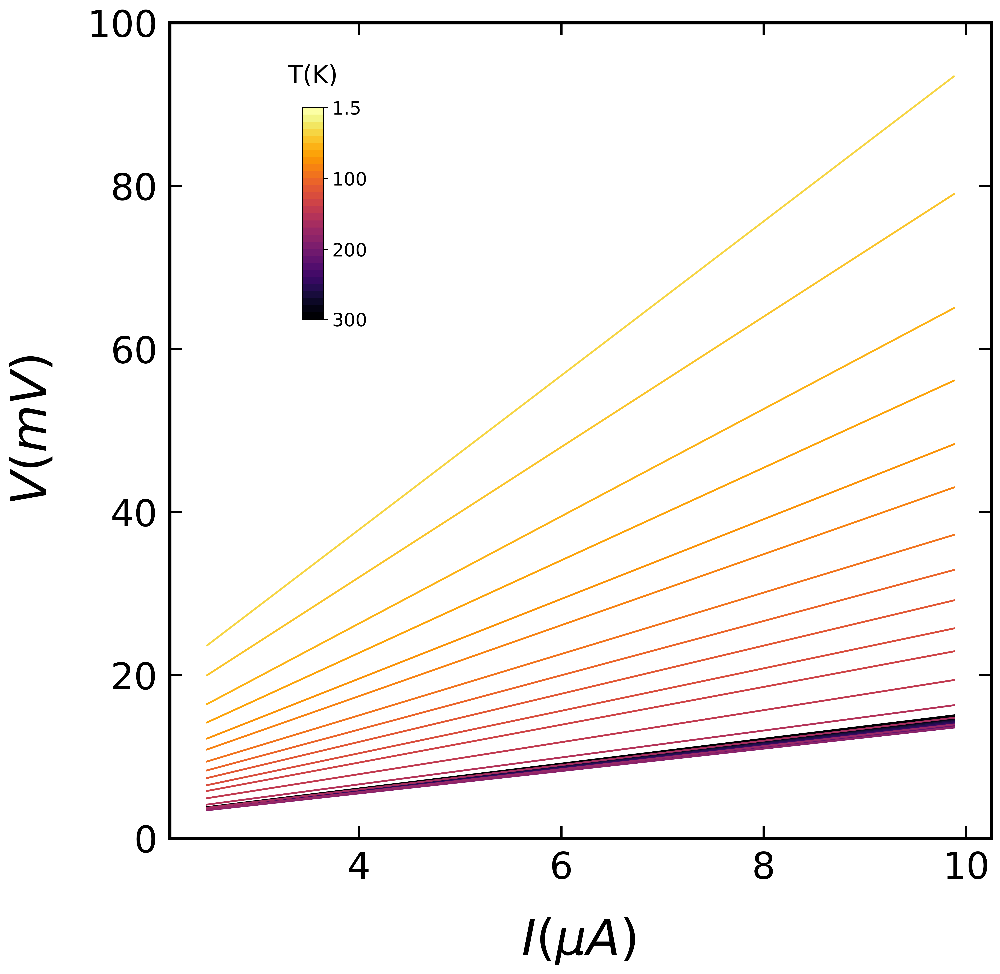

In [11]:
fig, ax = plt.subplots(figsize=(12, 12), dpi = 500)
temperature_list = findtemperature(pathlist_Hall_Bar_6_IVs_longsweep)
cm = plt.get_cmap('inferno', 30)

for i,path in enumerate(pathlist_Hall_Bar_6_IVs_longsweep_cut_and_fitted):
    

    data = np.loadtxt(path,delimiter = ",",skiprows = 1,usecols = (1,2,3),unpack = True)
    current = data[0]
    V_Keithley = data[1]
    Line_Fit = data[2]
    
    
    
    
    plus2uA = closest_element_index(current,2.5)
    plus10uA = closest_element_index(current,10)
    minus2uA = closest_element_index(current,-2.5)
    minus10uA = closest_element_index(current,-9.89)



    b1_start = current[int(plus2uA[0])]
    b1_end = current[int(plus10uA[0])]
    b2_start = current[int(plus10uA[0])]
    b2_end = current[int(plus2uA[1])]
    b3_start = current[int(minus2uA[0])]
    b3_end = current[int(minus10uA[0])]
    b4_start = current[int(minus10uA[0])]
    b4_end = current[int(minus2uA[0])]
    b1_start_index = np.where(current == b1_start)[0][0]
    b1_end_index = np.where(current == b1_end)[0][0]
    b2_start_index = np.where(current == b2_start)[0][0]
    b2_end_index = np.where(current == b2_end)[0][0]
    b3_start_index = np.where(current == b3_start)[0][0]
    b3_end_index = np.where(current == b3_end)[0][0]
    b4_start_index = np.where(current == b4_start)[0][0]
    b4_end_index = np.where(current == b4_end)[0][1]


    branch1_x = current[b1_start_index:b1_end_index]
    branch2_x = current[b2_start_index:b2_end_index]
    branch3_x = current[b3_start_index:b3_end_index]
    branch4_x = current[b4_start_index:b4_end_index+1]
    

    branch1_y = Line_Fit[b1_start_index:b1_end_index]
    branch2_y = Line_Fit[b2_start_index:b2_end_index]
    branch3_y = Line_Fit[b3_start_index:b3_end_index]
    branch4_y = Line_Fit[b4_start_index:b4_end_index+1]



    f_1 = interpolate.interp1d(branch1_x, branch1_y,fill_value="extrapolate")
    V_Keithley_1_int = f_1(branch1_x)

    f_2 = interpolate.interp1d(branch2_x, branch2_y,fill_value="extrapolate")
    V_Keithley_2_int = f_2(branch1_x[::-1])
    V_Keithley_2_int = V_Keithley_2_int[::-1]


    f_3 = interpolate.interp1d(branch3_x, branch3_y,fill_value="extrapolate")
    V_Keithley_3_int = f_3(branch1_x[::-1])
    V_Keithley_3_int = V_Keithley_3_int[::-1]


    f_4 = interpolate.interp1d(branch4_x, branch4_y,fill_value="extrapolate")
    V_Keithley_4_int = f_4(branch1_x)

    Sym_1_3 = (V_Keithley_1_int + V_Keithley_3_int)/2
    Sym_2_4 = (V_Keithley_2_int + V_Keithley_4_int)/2
    
    Sym_1_2 = (V_Keithley_1_int + V_Keithley_2_int)/2
    
    

    Sym_both = (Sym_1_3 + Sym_2_4)/2
    
    ax.set_ylim(0,100)

    ax.plot(branch1_x,Sym_both,color=cm(i/len(temperature_list)-0.1))

    
    df = pd.DataFrame({'current':branch1_x,'V_Keithley':Sym_1_2})
    df.to_csv(r'C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Symmetrised\ ' + str(i) + " " + 'FM301 Hall Bar 6 Symmetrised IVs' + " " + str(temperature_list[i]) + "K" + '.csv')

ax.set_xlabel("$I (\mu A)$ ",fontsize=40,labelpad = 25)
ax.set_ylabel(r'$V(mV)$',fontsize=40,labelpad = 25)

ax.tick_params(axis = 'x', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, top = True)
ax.tick_params(axis = 'y', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)
ax.tick_params(axis = 'y', which='minor', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)


ax.spines["top"].set_linewidth(2.5)
ax.spines["bottom"].set_linewidth(2.5)
ax.spines["right"].set_linewidth(2.5)
ax.spines["left"].set_linewidth(2.5)


norm = mpl.colors.Normalize(vmin=1.5, vmax=300)
sm = plt.cm.ScalarMappable(cmap=cm,norm = norm)
cax = fig.add_axes([0.25, 0.6, 0.02, 0.2])
tick_list = np.arange(temperature_list.min(),temperature_list.max(),80)
tick_list1 = [300,200,100,1.5]
cbar = plt.colorbar(sm, cax=cax, shrink = 0.01, orientation='vertical')
cbar.set_ticks(tick_list1[::-1])
cbar.set_ticklabels(list(map(str, tick_list1)))
cbar.ax.tick_params(labelsize=15)
cbar.ax.set_title('T(K)', fontsize = 20, pad = 20)


plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_Symmetrised_IVs.pdf",bbox_inches = "tight", format = "pdf")
plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_Symmetrised_IVs.png",bbox_inches = "tight")
plt.show()


    
    
# print(current)
# print(V_Keithley)


# print("i",i)
# print("path",path)
# print(plus2uA)
# print(plus10uA)
# print(minus2uA)
# print(minus10uA)

# print('b1_start',b1_start,b1_start_index)
# print('b1_end',b1_end,b1_end_index)
# print('b2_start',b2_start,b2_start_index)
# print('b2_end',b2_end,b2_end_index)
# print('b3_start',b3_start,b3_start_index)
# print('b3_end',b3_end,b3_end_index)
# print('b4_start',b4_start,b4_start_index)
# print('b4_end',b4_end,b4_end_index)

# print('branch1_x',len(branch1_x),branch1_x)
# print('branch2_x',len(branch2_x),branch2_x)
# print('branch3_x',len(branch3_x),branch3_x)
# print('branch4_x',len(branch4_x),branch4_x)

# print('V_Keithley_1_int',V_Keithley_1_int)
# print('V_Keithley_2_int',V_Keithley_2_int)
# print('V_Keithley_3_int',V_Keithley_3_int)
# print('V_Keithley_4_int',V_Keithley_4_int)


# plt.scatter(current,V_Keithley, s = 1)
#ax.xaxis.offsetText.set_fontsize(24)
#plt.legend(labels = temperature_list)

## R vs T ##

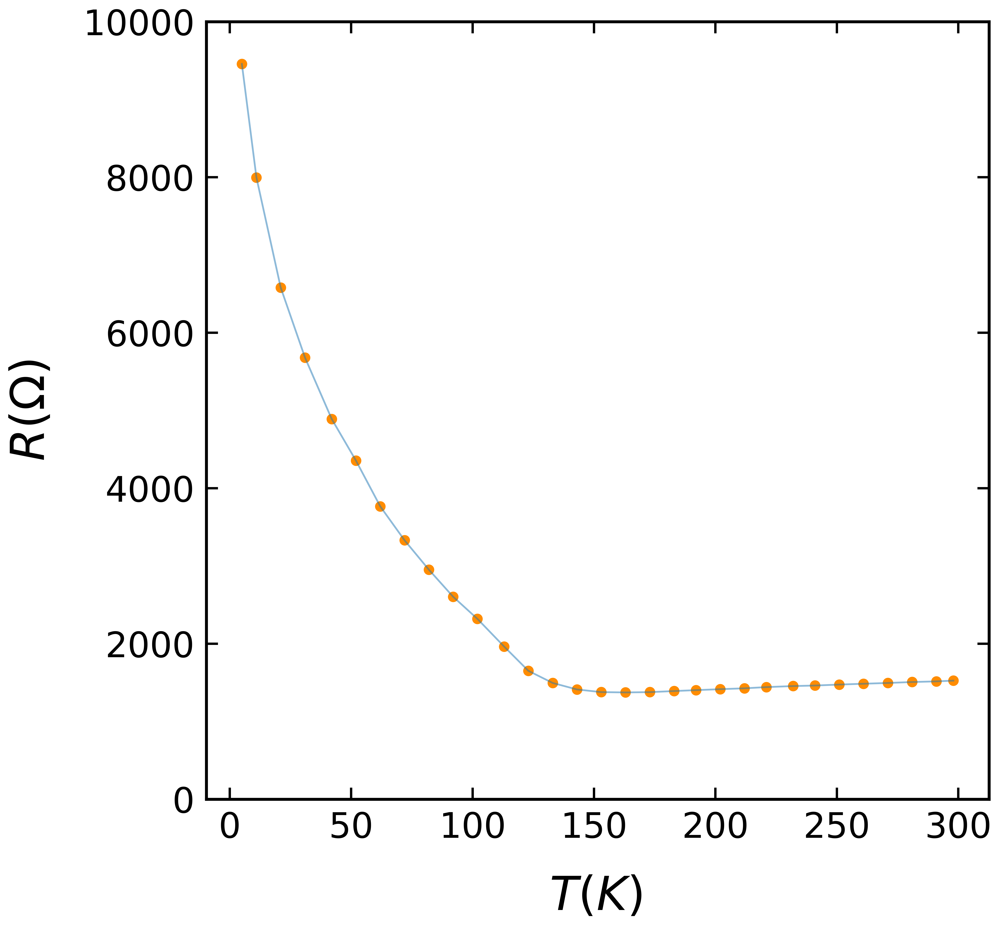

In [12]:
fig, ax = plt.subplots(figsize=(12, 12), dpi = 500)
temperature_list = findtemperature(pathlist_Hall_Bar_6_IVs_longsweep)

values_at_10uA = []


for i,path in enumerate(pathlist_Hall_Bar_6_IVs_longsweep_symmetrised_data):
    

    data = np.loadtxt(path,delimiter = ",",skiprows = 1,usecols = (1,2),unpack = True)
    current = data[0]
    V_Keithley = data[1]
    
    dV_dI_crude_10uA = (V_Keithley[-1]/current[-1])
    values_at_10uA = np.append(values_at_10uA,dV_dI_crude_10uA)

ax.set_ylim(0,10000)    
ax.scatter(temperature_list,values_at_10uA*1E3, color = "darkorange", alpha = 1, linewidth = 3 )
ax.plot(temperature_list,values_at_10uA*1E3, alpha = 0.5)
    

ax.set_xlabel("$T(K)$ ",fontsize=40,labelpad = 25)
ax.set_ylabel(r'$R(\Omega)$',fontsize=40,labelpad = 25)

ax.tick_params(axis = 'x', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, top = True)
ax.tick_params(axis = 'y', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)
ax.tick_params(axis = 'y', which='minor', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)


ax.spines["top"].set_linewidth(2.5)
ax.spines["bottom"].set_linewidth(2.5)
ax.spines["right"].set_linewidth(2.5)
ax.spines["left"].set_linewidth(2.5)

plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_IVs_Cooldown_dV_d_vs_T.pdf", bbox_inches = "tight", format = "pdf")
plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_IVs_Cooldown_dV_dI_vs_T.png", bbox_inches = "tight")
plt.show()

plt.show()

## Resitivity ##

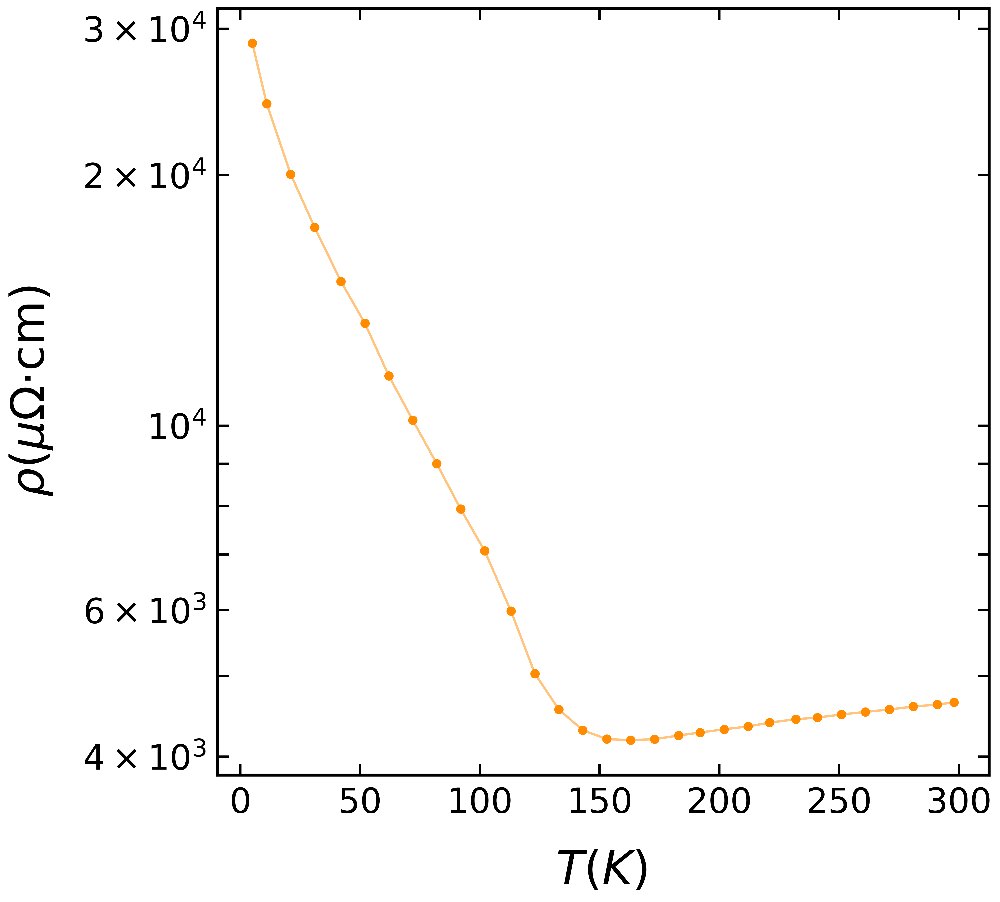

In [27]:
fig, ax = plt.subplots(figsize=(12, 12), dpi = 500)

#ax.set_ylim(0,30000)
ax.scatter(temperature_list, values_at_10uA*1E3 *(30.48E-9*10/10)*1E2*1E6, color = 'darkorange', s=50)
ax.plot(temperature_list,values_at_10uA*1E3 *(30.48E-9*10/10)*1E2*1E6, color = 'darkorange', lw = 2, alpha = 0.5)



ax.set_ylabel(r'$\rho$($\mu$$\Omega$⋅cm)',fontsize=40,labelpad = 25)
ax.set_xlabel("$T(K)$ ",fontsize=40,labelpad = 25)


ax.tick_params(axis = 'x', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, top = True)
ax.tick_params(axis = 'y', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)
ax.tick_params(axis = 'y', which='minor', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)

plt.yscale("log")
ax.get_yaxis().set_major_formatter(ticker.LogFormatterSciNotation(base=10))


ax.spines["top"].set_linewidth(2.5)
ax.spines["bottom"].set_linewidth(2.5)
ax.spines["right"].set_linewidth(2.5)
ax.spines["left"].set_linewidth(2.5)

df = pd.DataFrame({'temperature_list':temperature_list,'values_at_10uA':values_at_10uA*1E3 *(30.48E-9*10/10)*1E2*1E6})
df.to_csv(r'C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\R vs T\FM301 Hall Bar 6 Resitivity vs T cooldown.csv')
df.to_csv(r'C:\Users\pblah\Data\Navy Beach\FM301\Data\Resitivity Combined Pandas\FM301 Hall Bar 6 Resitivity vs T cooldown.csv')

plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_IVs_Cooldown_Resitivity_vs_T_Cooldown.pdf", bbox_inches = "tight", format = "pdf")
plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_IVs_Cooldown_Resitivity_vs_T_Cooldown.png", bbox_inches = "tight")
plt.show()







#### For Log Plot #########
#plt.yscale("log")
#ax.get_yaxis().set_major_formatter(matplotlib.ticker.LogFormatterSciNotation(base=10))
#ax.get_yaxis().set_minor_formatter(matplotlib.ticker.LogFormatterSciNotation(base=10, minor_thresholds = (10,0.1)))
#locmin = matplotlib.ticker.LogLocator(base=10.0, subs=(1,2,3,4,5,6)) 
#ax.yaxis.set_minor_locator(locmin)
#ax.yaxis.set_minor_formatter(matplotlib.ticker.LogFormatterSciNotation(base=10))
#ax.tick_params(axis='y', which='major', labelsize=30, direction = 'in')
#ax.tick_params(axis='y', which='minor', labelsize=20, width = 1, length = 10, direction = 'in')
#plt.ylim(1E3,1E5)
##################################

# Warmup #

### Plotting raw IVs ###

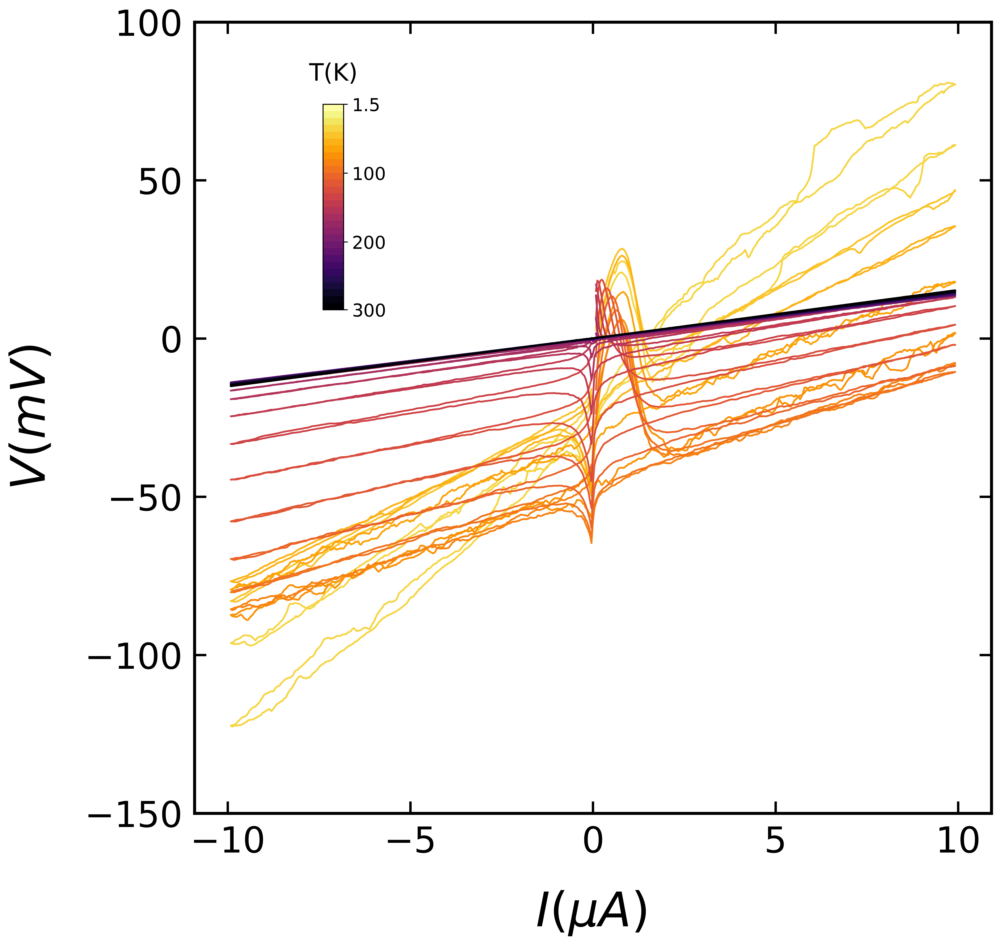

In [14]:
fig, ax = plt.subplots(figsize=(12, 12), dpi = 500)
temperature_list_warmup = findtemperature(pathlist_Hall_Bar_6_IVs_warmup_longsweep)
cm = plt.get_cmap('inferno_r', 30)
cm1 = plt.get_cmap('inferno', 30)

  
for i,data in enumerate(pathlist_Hall_Bar_6_IVs_warmup_longsweep):
    
    dataextracted = dataextractorIVs(data)
    current = dataextracted[0]
    V_Keithley = dataextracted[1]
    RLKin = dataextracted[1]
    

    ax.plot(current*1E6,V_Keithley*1E3 ,label = temperature_list_warmup[i], color=cm(i/len(temperature_list)+0.1))

ax.set_ylim(-150,100)
    
ax.set_xlabel("$I (\mu A)$ ",fontsize=40,labelpad = 25)
ax.set_ylabel(r'$V(mV)$',fontsize=40,labelpad = 25)

ax.tick_params(axis = 'x', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, top = True)
ax.tick_params(axis = 'y', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)
ax.tick_params(axis = 'y', which='minor', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)


ax.spines["top"].set_linewidth(2.5)
ax.spines["bottom"].set_linewidth(2.5)
ax.spines["right"].set_linewidth(2.5)
ax.spines["left"].set_linewidth(2.5)


norm = mpl.colors.Normalize(vmin=1.5, vmax=300)
sm = plt.cm.ScalarMappable(cmap=cm1,norm = norm)
cax = fig.add_axes([0.25, 0.6, 0.02, 0.20])
#tick_list = np.arange(temperature_list.min(),temperature_list.max(),80)
tick_list1 = [300,200,100,1.5]
cbar = plt.colorbar(sm, cax=cax, shrink = 0.01, orientation='vertical')
cbar.set_ticks(tick_list1[::-1])
cbar.set_ticklabels(list(map(str, tick_list1)))
cbar.ax.tick_params(labelsize=15)
cbar.ax.set_title('T(K)', fontsize = 20, pad = 20)

plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_IVs_Warmup_Longsweep_Raw.pdf",bbox_inches = "tight", format = "pdf")
plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_IVs_Warmup_Longsweep_Raw.png",bbox_inches = "tight")
plt.show()


#plt.legend(labels = temperature_list)
#plt.xlim(0.75E-5,1E-5)
#plt.ylim(0.01,0.017)
#ax.xaxis.offsetText.set_fontsize(24)


## Offsetting ##

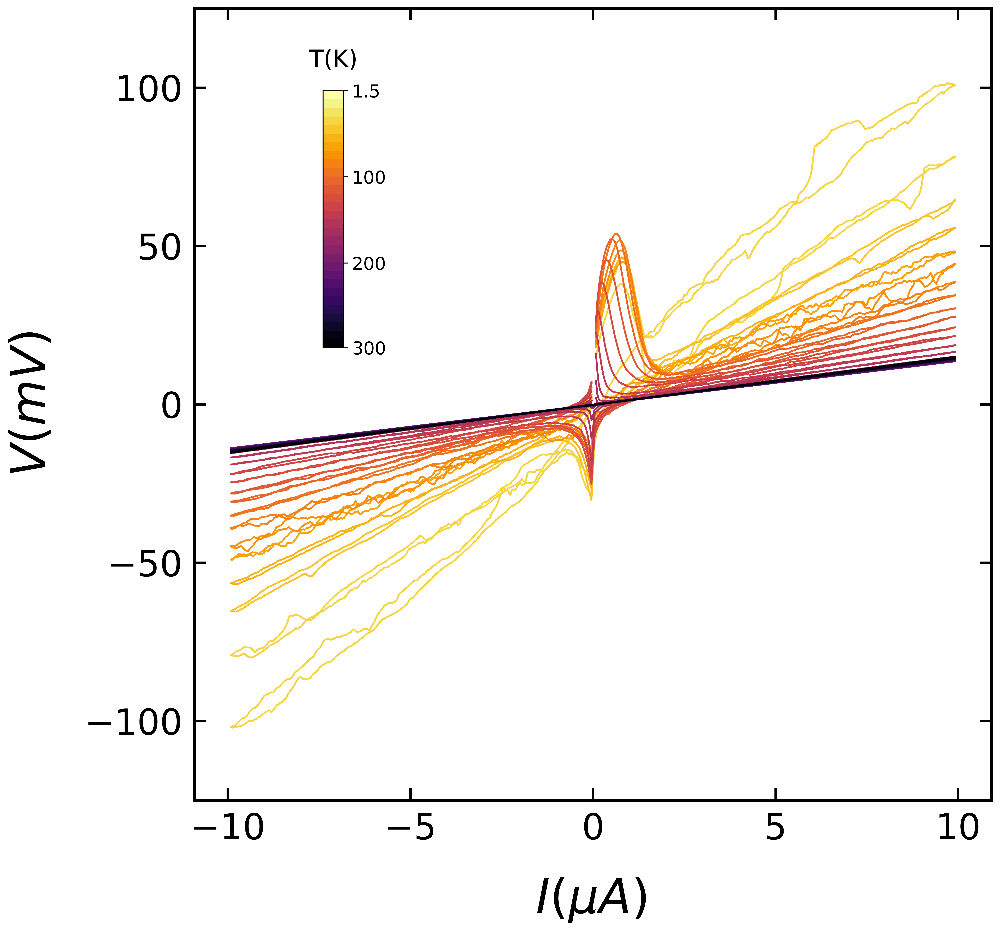

In [15]:
fig, ax = plt.subplots(figsize=(12, 12), dpi = 500)
cm = plt.get_cmap('inferno_r', 30)
cm1 = plt.get_cmap('inferno', 30)

temperature_list_warmup = findtemperature(pathlist_Hall_Bar_6_IVs_warmup_longsweep)

  
for i,path in enumerate(pathlist_Hall_Bar_6_IVs_warmup_longsweep):
    

    dataextracted = dataextractorIVs(path)
    current = dataextracted[0]
    V_Keithley = dataextracted[1]
    RLKin = dataextracted[1]
    
    plus10uA = int(closest_element_index(current,10E-6)[0])
    minus10uA = int(closest_element_index(current,-9.86E-6)[0])


    V_Keithley_endpoints = [V_Keithley[plus10uA],V_Keithley[minus10uA]]
    current_endpoints = [current[plus10uA],current[minus10uA]]

    line_y = interpolate.interp1d(current_endpoints, V_Keithley_endpoints, fill_value = "extrapolate")
    V_Keithley_int_line = line_y(current)
    offset = V_Keithley_int_line[0]
    V_Keithley_norm = V_Keithley - offset


    plt.plot(current*1E6,V_Keithley_norm*1E3,label = temperature_list_warmup[i],color=cm(i/len(temperature_list)+0.1))
    
    df = pd.DataFrame({'current':current,'V_Keithley':V_Keithley_norm})
    df.to_csv(r'C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Warmup\Offsetted\ '  + str(i) + '_' + str(i) + " " + 'FM301 Hall Bar 6 Warmup Offset IVs' + " " + str(temperature_list_warmup[i]) + "K" + '.csv')
    

ax.set_ylim(-125,125)
    
ax.set_xlabel("$I (\mu A)$ ",fontsize=40,labelpad = 25)
ax.set_ylabel(r'$V(mV)$',fontsize=40,labelpad = 25)

ax.tick_params(axis = 'x', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, top = True)
ax.tick_params(axis = 'y', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)
ax.tick_params(axis = 'y', which='minor', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)


ax.spines["top"].set_linewidth(2.5)
ax.spines["bottom"].set_linewidth(2.5)
ax.spines["right"].set_linewidth(2.5)
ax.spines["left"].set_linewidth(2.5)


norm = mpl.colors.Normalize(vmin=1.5, vmax=300)
sm = plt.cm.ScalarMappable(cmap=cm1,norm = norm)
cax = fig.add_axes([0.25, 0.55, 0.02, 0.25])
#tick_list = np.arange(temperature_list.min(),temperature_list.max(),80)
tick_list1 = [300,200,100,1.5]
cbar = plt.colorbar(sm, cax=cax, shrink = 0.01, orientation='vertical')
cbar.set_ticks(tick_list1[::-1])
cbar.set_ticklabels(list(map(str, tick_list1)))
cbar.ax.tick_params(labelsize=15)
cbar.ax.set_title('T(K)', fontsize = 20, pad = 20)

plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_IVs_Warmup_Longsweep_Offset_Fixed.pdf",bbox_inches = "tight", format = "pdf")
plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_IVs_Warmup_Longsweep_Offset_Fixed.png",bbox_inches = "tight")
plt.show()
    
#print("i",i)
#print("data",data)    
#plt.scatter(current[plus10uA],V_Keithley[plus10uA])
#plt.scatter(current[minus10uA],V_Keithley[minus10uA])
#print('V_Keithley plus10uA',V_Keithley[plus10uA])
#print('V_Keithley minus10uA',V_Keithley[minus10uA])
#plt.plot(current,V_Keithley_int_line)
#plt.scatter(current,V_Keithley,s=1, color = 'red')
#plt.plot(current,V_Keithley_int_line,color = 'blue')

#ax.xaxis.offsetText.set_fontsize(24)

#plt.legend(labels = temperature_list)

#plt.xlim(0.75E-5,1E-5)
#plt.ylim(0.01,0.017)


## Cut and Fitting (With help from Graham) ##

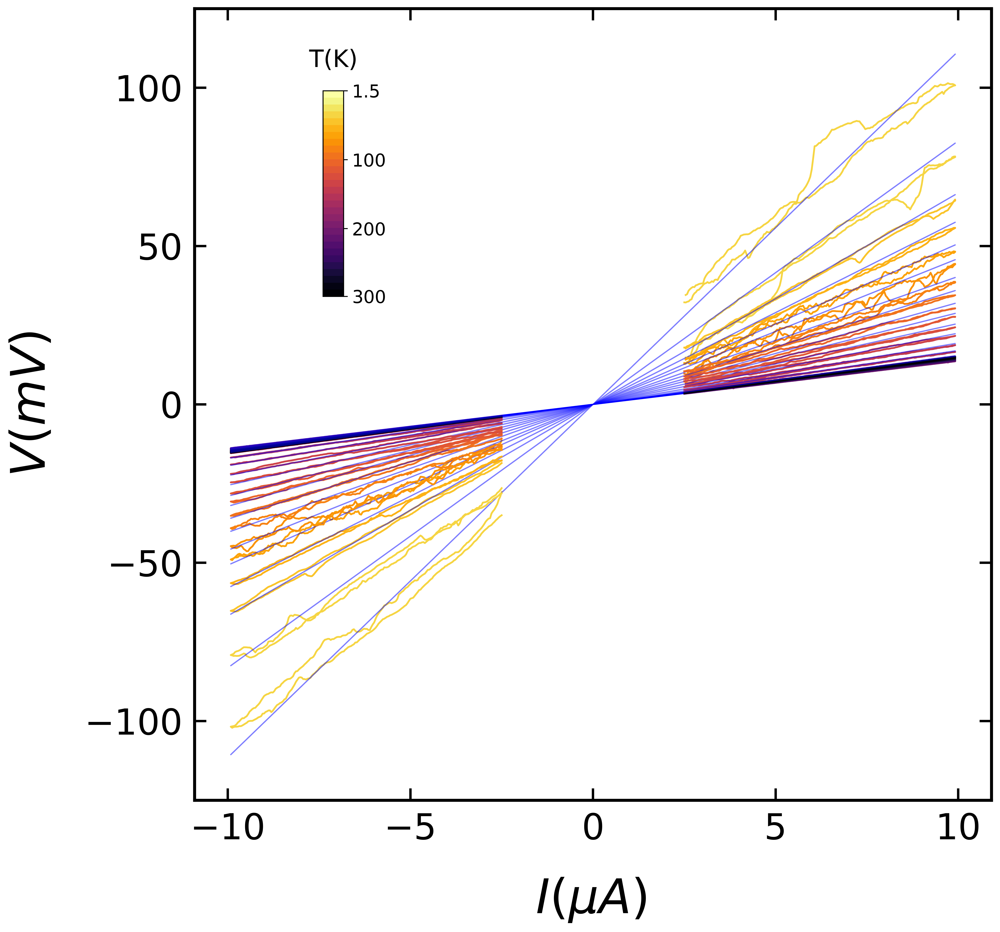

In [16]:
folder = folder_Hall_Bar_6_IVs_longsweep_normalised_data
temperature_list_warmup = findtemperature(pathlist_Hall_Bar_6_IVs_warmup_longsweep)

#print(temperature_list_warmup)

fig, ax = plt.subplots(figsize=(12, 12), dpi = 500)
cm = plt.get_cmap('inferno_r', 30)
cm1 = plt.get_cmap('inferno', 30)



for i,path in enumerate(pathlist_Hall_Bar_6_IVs_warmup_longsweep_offsetted):
    
   #print(i)

    data = np.loadtxt(path,delimiter = ",",skiprows = 1,usecols = (1,2),unpack = True)
    current = data[0]*1E6
    V_Keithley = data[1]*1E3

    threshold = 2.5
    current_masked = ma.masked_array(current, mask = np.logical_and(current<threshold,current>-threshold) )

    plt.plot(current_masked,V_Keithley,color=cm(i/len(temperature_list_warmup)+0.1))
    R=np.polyfit(current,V_Keithley, 1)[0]
    
    ax.set_ylim(-125,125)
    ax.plot(current,current*R,color= "blue",linewidth=1, alpha = 0.5)

    
    df = pd.DataFrame({'current':current,'V_Keithley':V_Keithley,'Line Fit':current*R})
    df.to_csv(r'C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Warmup\Cut and Fitted\ '  + str(i) + '_' + str(i) + " " + 'FM301 Hall Bar 6 Cut and Fitted Warmup IVs' + " " + str(temperature_list_warmup[i]) + "K" + '.csv')
    
    
ax.set_xlabel("$I (\mu A)$ ",fontsize=40,labelpad = 25)
ax.set_ylabel(r'$V(mV)$',fontsize=40,labelpad = 25)

ax.tick_params(axis = 'x', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, top = True)
ax.tick_params(axis = 'y', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)
ax.tick_params(axis = 'y', which='minor', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)


ax.spines["top"].set_linewidth(2.5)
ax.spines["bottom"].set_linewidth(2.5)
ax.spines["right"].set_linewidth(2.5)
ax.spines["left"].set_linewidth(2.5)


norm = mpl.colors.Normalize(vmin=1.5, vmax=300)
sm = plt.cm.ScalarMappable(cmap=cm1,norm = norm)
cax = fig.add_axes([0.25, 0.6, 0.02, 0.2])
#tick_list = np.arange(temperature_list.min(),temperature_list.max(),80)
tick_list1 = [300,200,100,1.5]
cbar = plt.colorbar(sm, cax=cax, shrink = 0.01, orientation='vertical')
cbar.set_ticks(tick_list1[::-1])
cbar.set_ticklabels(list(map(str, tick_list1)))
cbar.ax.tick_params(labelsize=15)
cbar.ax.set_title('T(K)', fontsize = 20, pad = 20)


plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301 Hall_Bar_6_Cut_Warmup_IVs_with_Line.png",bbox_inches = "tight")
plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_Cut_Warmup_IVs_with_Line.pdf",bbox_inches = "tight", format = "pdf")
plt.show()

## Symmetrising ##

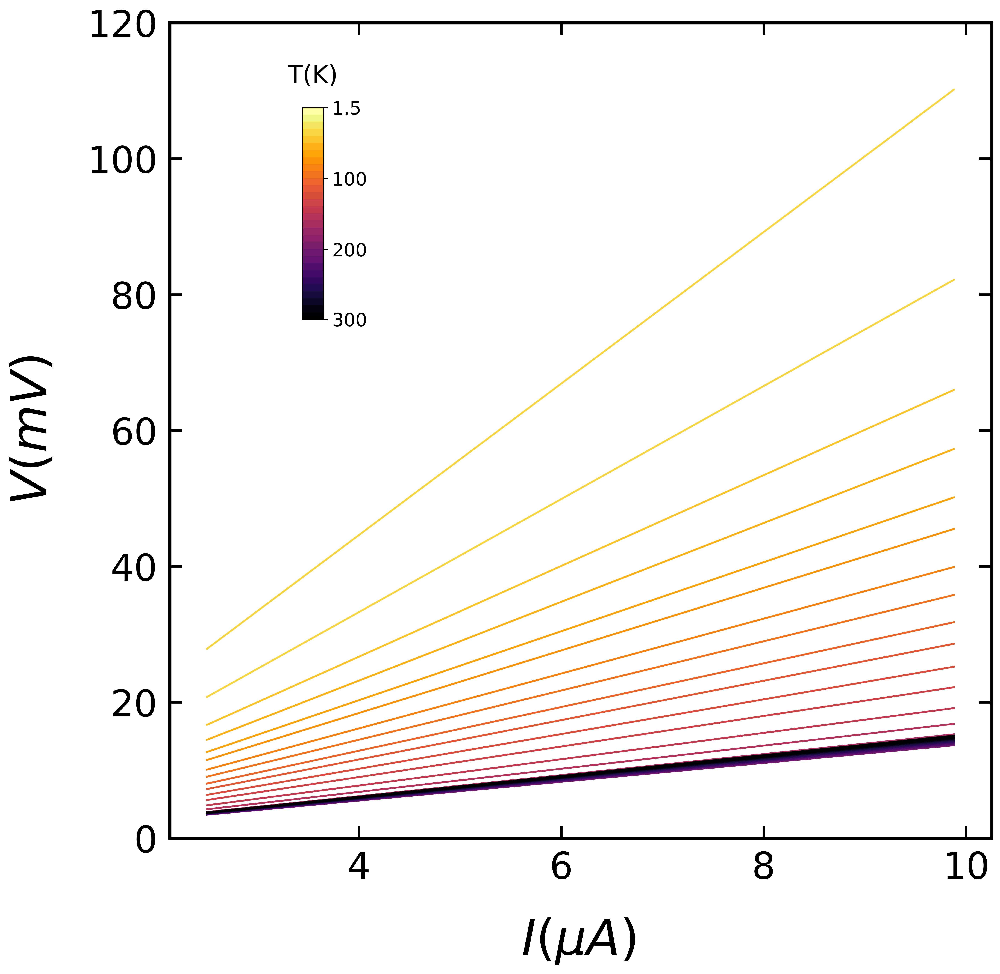

In [17]:
fig, ax = plt.subplots(figsize=(12, 12), dpi = 500)
temperature_list_warmup = findtemperature(pathlist_Hall_Bar_6_IVs_warmup_longsweep)
cm = plt.get_cmap('inferno_r', 30)
cm1 = plt.get_cmap('inferno', 30)

for i,path in enumerate(pathlist_Hall_Bar_6_IVs_longsweep_warmup_cut_and_fitted):
    

    data = np.loadtxt(path,delimiter = ",",skiprows = 1,usecols = (1,2,3),unpack = True)
    current = data[0]
    V_Keithley = data[1]
    Line_Fit = data[2]
    
    
    
    
    plus2uA = closest_element_index(current,2.5)
    plus10uA = closest_element_index(current,10)
    minus2uA = closest_element_index(current,-2.5)
    minus10uA = closest_element_index(current,-9.89)



    b1_start = current[int(plus2uA[0])]
    b1_end = current[int(plus10uA[0])]
    b2_start = current[int(plus10uA[0])]
    b2_end = current[int(plus2uA[1])]
    b3_start = current[int(minus2uA[0])]
    b3_end = current[int(minus10uA[0])]
    b4_start = current[int(minus10uA[0])]
    b4_end = current[int(minus2uA[0])]
    b1_start_index = np.where(current == b1_start)[0][0]
    b1_end_index = np.where(current == b1_end)[0][0]
    b2_start_index = np.where(current == b2_start)[0][0]
    b2_end_index = np.where(current == b2_end)[0][0]
    b3_start_index = np.where(current == b3_start)[0][0]
    b3_end_index = np.where(current == b3_end)[0][0]
    b4_start_index = np.where(current == b4_start)[0][0]
    b4_end_index = np.where(current == b4_end)[0][1]


    branch1_x = current[b1_start_index:b1_end_index]
    branch2_x = current[b2_start_index:b2_end_index]
    branch3_x = current[b3_start_index:b3_end_index]
    branch4_x = current[b4_start_index:b4_end_index+1]
    

    branch1_y = Line_Fit[b1_start_index:b1_end_index]
    branch2_y = Line_Fit[b2_start_index:b2_end_index]
    branch3_y = Line_Fit[b3_start_index:b3_end_index]
    branch4_y = Line_Fit[b4_start_index:b4_end_index+1]



    f_1 = interpolate.interp1d(branch1_x, branch1_y,fill_value="extrapolate")
    V_Keithley_1_int = f_1(branch1_x)

    f_2 = interpolate.interp1d(branch2_x, branch2_y,fill_value="extrapolate")
    V_Keithley_2_int = f_2(branch1_x[::-1])
    V_Keithley_2_int = V_Keithley_2_int[::-1]


    f_3 = interpolate.interp1d(branch3_x, branch3_y,fill_value="extrapolate")
    V_Keithley_3_int = f_3(branch1_x[::-1])
    V_Keithley_3_int = V_Keithley_3_int[::-1]


    f_4 = interpolate.interp1d(branch4_x, branch4_y,fill_value="extrapolate")
    V_Keithley_4_int = f_4(branch1_x)

    Sym_1_3 = (V_Keithley_1_int + V_Keithley_3_int)/2
    Sym_2_4 = (V_Keithley_2_int + V_Keithley_4_int)/2
    
    Sym_1_2 = (V_Keithley_1_int + V_Keithley_2_int)/2
    
    

    Sym_both = (Sym_1_3 + Sym_2_4)/2

    ax.set_ylim(0,120)
    ax.plot(branch1_x,Sym_both,color=cm(i/len(temperature_list)+0.1))

    
    df = pd.DataFrame({'current':branch1_x,'V_Keithley':Sym_1_2})
    df.to_csv(r'C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Warmup\Symmetrised\ '  + str(i) + '_' + str(i) + " " + 'FM301 Hall Bar 6 Warmup Symmetrised IVs' + " " + str(temperature_list_warmup[i]) + "K" + '.csv')

ax.set_xlabel("$I (\mu A)$ ",fontsize=40,labelpad = 25)
ax.set_ylabel(r'$V (mV)$',fontsize=40,labelpad = 25)

ax.tick_params(axis = 'x', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, top = True)
ax.tick_params(axis = 'y', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)
ax.tick_params(axis = 'y', which='minor', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)


ax.spines["top"].set_linewidth(2.5)
ax.spines["bottom"].set_linewidth(2.5)
ax.spines["right"].set_linewidth(2.5)
ax.spines["left"].set_linewidth(2.5)


norm = mpl.colors.Normalize(vmin=1.5, vmax=300)
sm = plt.cm.ScalarMappable(cmap=cm1,norm = norm)
cax = fig.add_axes([0.25, 0.6, 0.02, 0.2])
#tick_list = np.arange(temperature_list.min(),temperature_list.max(),80)
tick_list1 = [300,200,100,1.5]
cbar = plt.colorbar(sm, cax=cax, shrink = 0.01, orientation='vertical')
cbar.set_ticks(tick_list1[::-1])
cbar.set_ticklabels(list(map(str, tick_list1)))
cbar.ax.tick_params(labelsize=15)
cbar.ax.set_title('T(K)', fontsize = 20, pad = 20)


plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_Symmetrised_Warmup_IVs.pdf",bbox_inches = "tight", format = "pdf")
plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_Symmetrised_Warmup_IVs.png",bbox_inches = "tight")
plt.show()


    
    
# print(current)
# print(V_Keithley)


# print("i",i)
# print("path",path)
# print(plus2uA)
# print(plus10uA)
# print(minus2uA)
# print(minus10uA)

# print('b1_start',b1_start,b1_start_index)
# print('b1_end',b1_end,b1_end_index)
# print('b2_start',b2_start,b2_start_index)
# print('b2_end',b2_end,b2_end_index)
# print('b3_start',b3_start,b3_start_index)
# print('b3_end',b3_end,b3_end_index)
# print('b4_start',b4_start,b4_start_index)
# print('b4_end',b4_end,b4_end_index)

# print('branch1_x',len(branch1_x),branch1_x)
# print('branch2_x',len(branch2_x),branch2_x)
# print('branch3_x',len(branch3_x),branch3_x)
# print('branch4_x',len(branch4_x),branch4_x)

# print('V_Keithley_1_int',V_Keithley_1_int)
# print('V_Keithley_2_int',V_Keithley_2_int)
# print('V_Keithley_3_int',V_Keithley_3_int)
# print('V_Keithley_4_int',V_Keithley_4_int)


# plt.scatter(current,V_Keithley, s = 1)
#ax.xaxis.offsetText.set_fontsize(24)
#plt.legend(labels = temperature_list)

# R vs T #

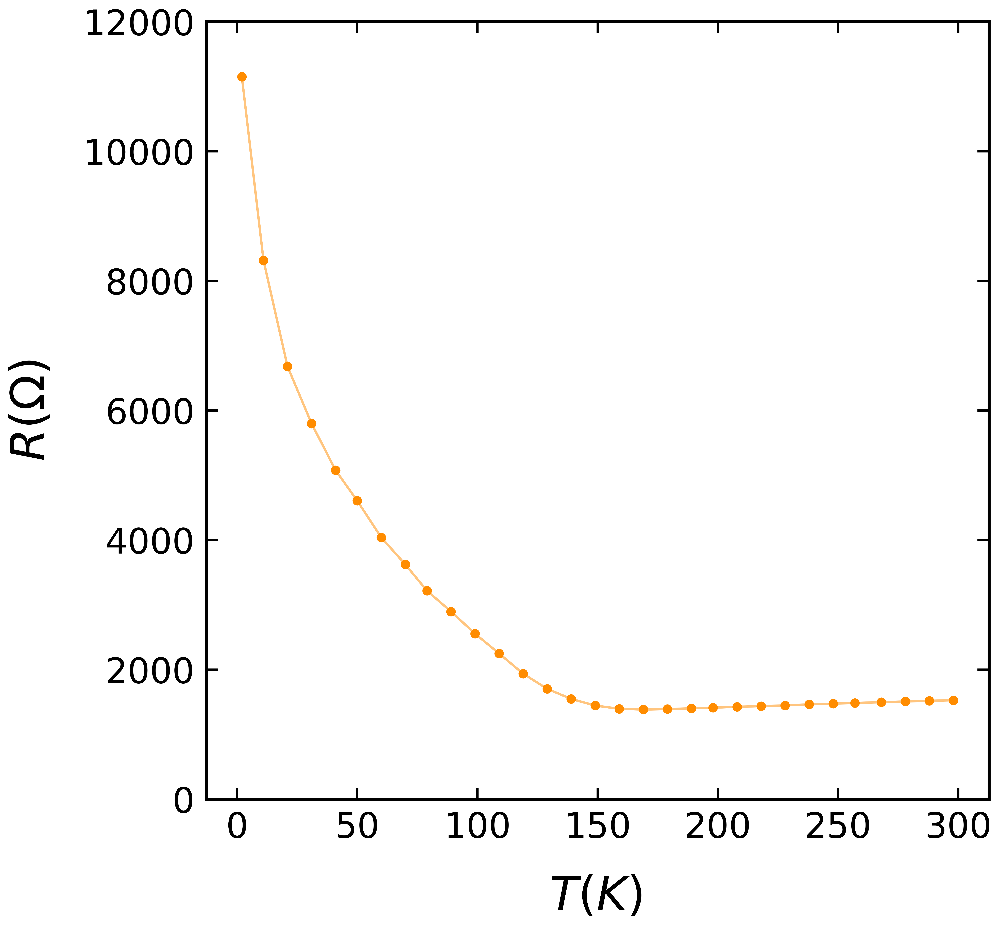

In [19]:
fig, ax = plt.subplots(figsize=(12, 12), dpi = 500)
temperature_list_warmup = findtemperature(pathlist_Hall_Bar_6_IVs_warmup_longsweep)

values_at_10uA_warmup = []


for i,path in enumerate(pathlist_Hall_Bar_6_IVs_longsweep_warmup_symmetrised_data):
    

    data = np.loadtxt(path,delimiter = ",",skiprows = 1,usecols = (1,2),unpack = True)
    current = data[0]
    V_Keithley = data[1]
    
    dV_dI_crude_10uA = (V_Keithley[-1]/current[-1])
    values_at_10uA_warmup = np.append(values_at_10uA_warmup,dV_dI_crude_10uA)

ax.set_ylim(0,12000)    
ax.scatter(temperature_list_warmup,values_at_10uA_warmup*1E3, color = 'darkorange', s=50)
ax.plot(temperature_list_warmup,values_at_10uA_warmup*1E3, color = 'darkorange', lw = 2, alpha = 0.5)


ax.set_xlabel("$T(K)$ ",fontsize=40,labelpad = 25)
ax.set_ylabel(r'$R(\Omega)$',fontsize=40,labelpad = 25)

ax.tick_params(axis = 'x', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, top = True)
ax.tick_params(axis = 'y', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)
ax.tick_params(axis = 'y', which='minor', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)


ax.spines["top"].set_linewidth(2.5)
ax.spines["bottom"].set_linewidth(2.5)
ax.spines["right"].set_linewidth(2.5)
ax.spines["left"].set_linewidth(2.5)

plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_IVs_Warmup_dV_dI_vs_T.pdf", bbox_inches = "tight", format = "pdf")
plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_IVs_Warmup_dV_dI_vs_T.png", bbox_inches = "tight")


plt.show()

## Resitivity vs T ##

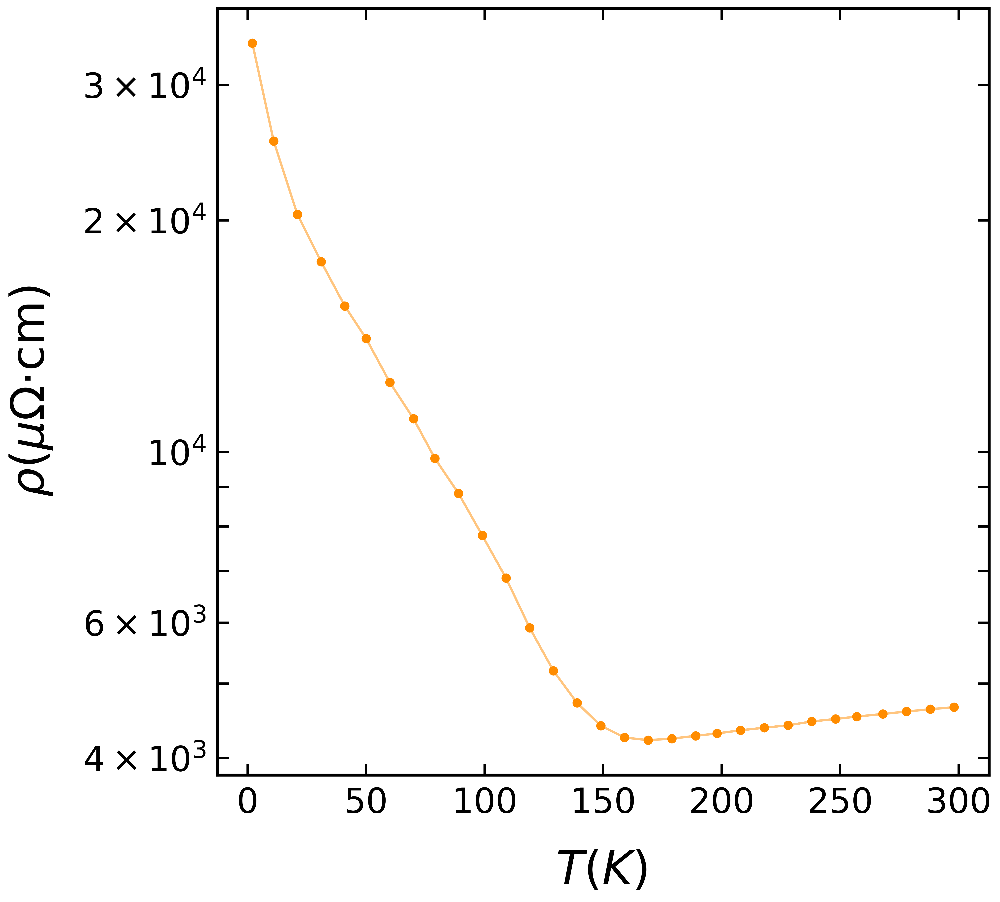

In [25]:
fig, ax = plt.subplots(figsize=(12, 12), dpi = 500)


ax.scatter(temperature_list_warmup, values_at_10uA_warmup*1E3 *(30.48E-9*10/10)*1E2*1E6, color = 'darkorange', s=50)
ax.plot(temperature_list_warmup,values_at_10uA_warmup*1E3 *(30.48E-9*10/10)*1E2*1E6, color = 'darkorange', lw = 2, alpha = 0.5)


ax.set_ylabel(r'$\rho$($\mu$$\Omega$⋅cm)',fontsize=40,labelpad = 25)
ax.set_xlabel("$T(K)$ ",fontsize=40,labelpad = 25)


ax.tick_params(axis = 'x', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, top = True)
ax.tick_params(axis = 'y', which='major', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)
ax.tick_params(axis = 'y', which='minor', labelsize=30, length = 10, width = 2, direction = 'in', pad = 10, right = True)


plt.yscale("log")
ax.get_yaxis().set_major_formatter(ticker.LogFormatterSciNotation(base=10))
#ax.get_yaxis().set_minor_formatter(ticker.LogFormatterSciNotation(base=10, minor_thresholds = (10,1)))

ax.spines["top"].set_linewidth(2.5)
ax.spines["bottom"].set_linewidth(2.5)
ax.spines["right"].set_linewidth(2.5)
ax.spines["left"].set_linewidth(2.5)

df = pd.DataFrame({'temperature_list_warmup':temperature_list_warmup,'values_at_10uA_warmup':values_at_10uA_warmup*1E3 *(30.48E-9*10/10)*1E2*1E6})
df1 = pd.DataFrame({'temperature_list':temperature_list_warmup,'values_at_10uA':values_at_10uA_warmup*1E3 *(30.48E-9*10/10)*1E2*1E6})
df.to_csv(r'C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\Warmup\R vs T\FM301 Hall Bar 6 Resitivity vs T warmup.csv')
df1.to_csv(r'C:\Users\pblah\Data\Navy Beach\FM301\Data\Resitivity Combined Pandas\FM301 Hall Bar 6 Resitivity vs T warmup.csv')


plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_IVs_Cooldown_Resitivity_vs_T_Warmup.pdf", bbox_inches = "tight", format = "pdf")
plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301_Hall_Bar_6_IVs_Cooldown_Resitivity_vs_T_Warmup.png", bbox_inches = "tight")

plt.show()







#### For Log Plot #########
#plt.yscale("log")
#ax.get_yaxis().set_major_formatter(matplotlib.ticker.LogFormatterSciNotation(base=10))
#ax.get_yaxis().set_minor_formatter(matplotlib.ticker.LogFormatterSciNotation(base=10, minor_thresholds = (10,0.1)))
#locmin = matplotlib.ticker.LogLocator(base=10.0, subs=(1,2,3,4,5,6)) 
#ax.yaxis.set_minor_locator(locmin)
#ax.yaxis.set_minor_formatter(matplotlib.ticker.LogFormatterSciNotation(base=10))
#ax.tick_params(axis='y', which='major', labelsize=30, direction = 'in')
#ax.tick_params(axis='y', which='minor', labelsize=20, width = 1, length = 10, direction = 'in')
#plt.ylim(1E3,1E5)
##################################

# Quick check of both #

In [ ]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)
labels = ['Cooldown','Warmup']

plt.scatter(temperature_list[0:len(temperature_list)-1],values_at_10uA[0:len(values_at_10uA)-1]*1E3, color = "green", alpha = 1, linewidth = 3 )
plt.plot(temperature_list[0:len(temperature_list)-1],values_at_10uA[0:len(values_at_10uA)-1]*1E3, alpha = 0.5)
plt.scatter(temperature_list_warmup[1::],values_at_10uA_warmup[1::]*1E3 , color = "darkorange", alpha = 1, linewidth = 3 )
plt.plot(temperature_list_warmup[1::],values_at_10uA_warmup[1::]*1E3, alpha = 0.5)



plt.legend(labels = labels, fontsize = 30)
plt.title(r'R vs T Cooldown vs Warmup',fontsize = 30, pad = 20)
plt.ylabel(r'R ($\Omega$)',fontsize =30, labelpad = 20)
plt.xlabel("$T(K)$ ",fontsize =30,labelpad = 20)
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)


# Fitting #

## Metallic Region ##

### Resitivity ###

In [ ]:
"10.1126/sciadv.1500797"

import sys
np.set_printoptions(threshold=1000) # can change to sys.maxsize, default is 1000


fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)



#print(CCLXXX)
#print(CC)


for i in np.arange(0,1,1):
    

    
    if i==0:
        
        temperature = temperature_list 
        resitivity4pt = values_at_10uA*1E3 *(30.48E-9*10/10)*1E2*1E6
        
        CCLXXX = int(closest_element_index(temperature,280)[0])
        CC = int(closest_element_index(temperature,165)[0])

        temperature_metallic_region = temperature[CCLXXX:CC]
        resitivity4pt_metallic_region = resitivity4pt[CCLXXX:CC]
        
        plt.plot(temperature_metallic_region,resitivity4pt_metallic_region, color = 'black')
        
        ##### Numpy Polynomial Fit 1st Order #####
        
        a, b = np.polynomial.polynomial.polyfit(temperature_metallic_region,resitivity4pt_metallic_region, 1)
        print('a',a)
        print('b',b)
        fit1 = a + b*temperature_metallic_region
        print('Polynomial Fit 1st Order', np.polynomial.polynomial.Polynomial([a,b]))
        plt.plot(temperature_metallic_region, fit1, linestyle = "--", linewidth = 2, color = 'orange', alpha = 1)
        
        #pd.DataFrame({'a':[a],'b':[b]}).to_csv(r'C:\Users\pblah\Data\Navy Beach\FM318\Data\Film\RT\Fitting Parameters\Linear Fit\ ' + 
        #'Linear_Fitting_Params' + '.csv')
        
        ################################
        
        ##### Numpy Polynomial Fit 2nd Order #####
        
        c, d, e = np.polynomial.polynomial.polyfit(temperature_metallic_region,resitivity4pt_metallic_region, 2)
        print('c',c)
        print('d',d)
        print('e',e)
        fit2 = c + d*temperature_metallic_region +e*(temperature_metallic_region)**2
        print('Polynomial Fit 2nd Order', np.polynomial.polynomial.Polynomial([c,d,e]))
        plt.plot(temperature_metallic_region, fit2, linestyle = "--", linewidth = 2, color = 'red', alpha = 1)
        
        ################################

        
        #plt.title("FM318 Film RT",fontsize = 30)
        #plt.ylabel(r'$Ln(d\rho_{xx}/dT)$',fontsize =30, labelpad = 20)
        #plt.xlabel("$Ln(T)$(K)",fontsize =30,labelpad = 20)
        #plt.yticks(fontsize=20)
        #plt.xticks(fontsize=20)
        #plt.ylim(-5,5)
      

        
        #slope = np.gradient(np.log(gradient),np.log(temperature_metallic_region))
        
        #n = slope + 1
        
#plt.plot(np.log(temperature_metallic_region),n)

#plt.ylim(-0.25E6,0.25E6)

#plt.title("n")
plt.show()
        
#temperature_insulating_region = temperature[CC::]        
        
        

## Conductivity ##

In [ ]:
"10.1126/sciadv.1500797"

import sys
np.set_printoptions(threshold=1000) # can change to sys.maxsize, default is 1000


fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)



#print(CCLXXX)
#print(CC)


for i in np.arange(0,1,1):
    

    
    if i==0:
        
        temperature = temperature_list 
        resitivity4pt = values_at_10uA*1E3 *(30.48E-9*10/10)*1E2*1E6
        
        CCLXXX = int(closest_element_index(temperature,280)[0])
        CC = int(closest_element_index(temperature,165)[0])

        temperature_metallic_region = temperature[CCLXXX:CC]
        resitivity4pt_metallic_region = resitivity4pt[CCLXXX:CC]
        
        conductivity4pt_metallic_region = 1/(resitivity4pt[CCLXXX:CC])
        
        plt.plot(temperature_metallic_region,conductivity4pt_metallic_region, color = 'black')
        
        ##### Numpy Polynomial Fit 1st Order #####
        
        a, b = np.polynomial.polynomial.polyfit(temperature_metallic_region,conductivity4pt_metallic_region, 1)
        print('a',a)
        print('b',b)
        fit1 = a + b*temperature_metallic_region
        print('Polynomial Fit 1st Order', np.polynomial.polynomial.Polynomial([a,b]))
        plt.plot(temperature_metallic_region, fit1, linestyle = "--", linewidth = 2, color = 'orange', alpha = 1)
        
        pd.DataFrame({'a':[a],'b':[b]}).to_csv(r'C:\Users\pblah\Data\Navy Beach\FM301\Data\IVS\R vs T\Fitting Parameters\Linear Fit\ ' + 
        'Linear_Fitting_Params' + '.csv')
        
        ################################
        
        ##### Numpy Polynomial Fit 2nd Order #####
        
        c, d, e = np.polynomial.polynomial.polyfit(temperature_metallic_region,conductivity4pt_metallic_region, 2)
        print('c',c)
        print('d',d)
        print('e',e)
        fit2 = c + d*temperature_metallic_region +e*(temperature_metallic_region)**2
        print('Polynomial Fit 2nd Order', np.polynomial.polynomial.Polynomial([c,d,e]))
        plt.plot(temperature_metallic_region, fit2, linestyle = "--", linewidth = 2, color = 'red', alpha = 1)
        
        ################################

        
        plt.title("FM301 Membrane Conductivity",fontsize = 30)
        #plt.ylabel(r'$Ln(d\rho_{xx}/dT)$',fontsize =30, labelpad = 20)
        #plt.xlabel("$Ln(T)$(K)",fontsize =30,labelpad = 20)
        #plt.yticks(fontsize=20)
        #plt.xticks(fontsize=20)
        #plt.ylim(-5,5)
      

        
        #slope = np.gradient(np.log(gradient),np.log(temperature_metallic_region))
        
        #n = slope + 1
        
#plt.plot(np.log(temperature_metallic_region),n)

#plt.ylim(-0.25E6,0.25E6)

#plt.title("n")
plt.show()
        
#temperature_insulating_region = temperature[CC::]        
        
        

## Combining into one curve ###

In [ ]:
labels = ["FM301_Hall_Bar"]
samples_dict = {}

single_curves_list_temperature = []
single_curves_list_resitivity4pt = []
    
for i,path in enumerate(pathlist_Hall_Bar_6_IVs_combining_pandas[::-1]): 
    
    print(path)
    
    x = pd.read_csv(path)
    Temperature = pd.DataFrame(x).temperature_list.values.tolist()
    Resitivity_4pt = pd.DataFrame(x).values_at_10uA.values.tolist()
    print(Resitivity_4pt)

    single_curves_list_temperature.append(Temperature)
    single_curves_list_resitivity4pt.append(Resitivity_4pt)
    
    
    
for i, name in enumerate(labels):
    
    samples_dict[labels[i] + '_' + 'temperature_list' + '_' + 'full'] = single_curves_list_temperature[i*2] + single_curves_list_temperature[(i*2)+1]
    samples_dict[labels[i] + '_' + 'values_at_10uA' + '_' + 'full'] = single_curves_list_resitivity4pt[i*2] + single_curves_list_resitivity4pt[(i*2)+1]    

    pd.DataFrame({'temperature':samples_dict[labels[i] + '_' + 't' + '_' + 'full'],'resitivity4pt':samples_dict[labels[i] + '_' + 'r4pt' + '_' + 'full']}).to_csv(r'C:\Users\pblah\Data\Navy Beach\FM301\Data\Resitivity Combined Pandas\Full Curve\ ' + 
    str(labels[0]) + '_' + 'RvsT_Full' + '.csv')

# Legacy Code #

In [ ]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

temperature_list = findtemperature(pathlist_Hall_Bar_6_IVs_longsweep)

    
for i,path in enumerate(pathlist_Hall_Bar_6_IVs_longsweep_normalised_data):
    
    #print(path)

    data = np.loadtxt(path,delimiter = ",",skiprows = 1,usecols = (1,2),unpack = True)
    branch1_x = data[0]
    Sym_both = data[1]
    dI_dV = np.gradient(Sym_both,branch1_x)
    a, b = np.polyfit(branch1_x, dI_dV, 1)
    #plt.scatter(current,dI_dV,s=1)
    plt.plot(branch1_x, a*branch1_x+b,label = temperature_list[i])          
    
plt.legend(labels = temperature_list)
plt.title("dV/dI vs I Long Sweep",fontsize = 30)
plt.ylabel(r'$dV/dI (K\Omega)$',fontsize =20)
plt.xlabel("$I (\mu A)$ ",fontsize =20)
#plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301 Hall Bar 6 IVs Symmetrised dV_dI vs I.png")
plt.show()  

In [ ]:
from scipy.interpolate import CubicSpline, PchipInterpolator, Akima1DInterpolator

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)


temperature_list = findtemperature(pathlist_Hall_Bar_6_IVs_longsweep)
values_at_1uA = []

    
for i,path in enumerate(pathlist_Hall_Bar_6_IVs_longsweep_symmetrised_data):

    data = np.loadtxt(path,delimiter = ",",skiprows = 1,usecols = (1,2),unpack = True)
    branch1_x = data[0]
    
    Sym_both = data[1]
    dV_dI_crude_10uA = (Sym_both[-1])/branch1_x[-1]
    plt.scatter(temperature_list[i], dV_dI_crude_10uA,label = temperature_list[i])
    values_at_1uA = np.append(values_at_1uA,dV_dI_crude_10uA)
    
  
    

plt.title("dV/dI vs T",fontsize = 30)
plt.ylabel(r'$dV/dI (K\Omega)$',fontsize =20)
plt.xlabel("$T(K)$ ",fontsize =20)

temperature_list = temperature_list[::-1]
values_at_1uA = values_at_1uA[::-1]


f_cooldown = interpolate.PchipInterpolator(temperature_list, values_at_1uA)
xnew_cooldown = np.arange(temperature_list[0],temperature_list[len(temperature_list)-1],1)
ynew_cooldown = f_cooldown(xnew_cooldown)
plt.plot(xnew_cooldown, ynew_cooldown)
plt.title(r'R vs T',fontsize = 30, pad = 20)
plt.ylabel(r'R (k$\Omega$)',fontsize =30, labelpad = 20)
plt.xlabel("$T(K)$ ",fontsize =30,labelpad = 20)
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
#plt.savefig(r"C:\Users\pblah\Data\Navy Beach\FM301\Figures\FM301 Hall Bar 6 IVs Cooldown dV_dI vs T.png", bbox_inches = "tight")
plt.show()

#plt.legend(labels = temperature_list)
#dV_dI = np.gradient(Sym_both,branch1_x)
#a, b = np.polyfit(branch1_x, dV_dI, 1)
#plt.scatter(current,dI_dV)
#line = a*current+b

#print(line[-1])
#plt.legend(labels = temperature_list[i])

#plus10uA = int(closest_element_index(branch1_x,np.max(branch1_x))[0]))
#plt.scatter(temperature_list[i], line[-1],label = temperature_list[i])

#print(values_at_1uA)
#print(temperature_list)

#print(xnew_cooldown)

